# Setting Environment

In [ ]:
#libraries
import pandas as pd
import numpy as np

In [ ]:
#import data
! gdown --id 1zwm3rZVAjR9yYt79LqsuxY8pi88Uo2Wz
! gdown --id 1J7rYovMdV3TqRuIo6uzCmEEa35RHBHr1
! gdown --id 10Vqv1BTNq1aSaLWrhEPmUKCIt4TUEIfI
! gdown --id 1--j71Mb_pyUlRT7opb5M8_qxr8ijA6iG
! gdown --id 1DBwsKAxrNYIHec2kcpZa6sCP_jUcWd1N

Downloading...
From: https://drive.google.com/uc?id=1zwm3rZVAjR9yYt79LqsuxY8pi88Uo2Wz
To: /content/listings-2.csv
100% 5.55M/5.55M [00:00<00:00, 23.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1J7rYovMdV3TqRuIo6uzCmEEa35RHBHr1
To: /content/listings.csv
100% 86.7M/86.7M [00:02<00:00, 37.5MB/s]
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=10Vqv1BTNq1aSaLWrhEPmUKCIt4TUEIfI 

Downloading...
From: https://drive.google.com/uc?id=1--j71Mb_pyUlRT7opb5M8_qxr8ijA6iG
To: /content/reviews.csv
100% 22.4M/22.4M [00:00<00:00, 42.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1DBwsKAxrNYIHec2kcpZa6sCP_jUcWd1N
To: /content/df_review.csv
100% 589k/589k [00:00<00:00, 4.60MB/s]


In [ ]:
#data
df_review = pd.read_csv('df_review.csv')
listings = pd.read_csv('listings.csv')
listings2 = pd.read_csv('listings-2.csv')

In [ ]:
listing.rename(columns={'id':'listing_id'},inplace=True)
listing.drop_duplicates(inplace=True)
listing2.rename(columns={'id':'listing_id'},inplace=True)
listing2.drop_duplicates(inplace=True)

#double check
#len(listing)
#len(listing2)

In [ ]:
merged_df = pd.concat([listing,listing2],axis = 1)
merged_df.to_csv('merged_df.csv')

In [ ]:
listing2.shape

(33329, 18)

In [ ]:
merged_df.shape

(33329, 92)

# NLP for reviews

In [ ]:
reviews=pd.read_csv('reviews.csv')
reviews2=pd.read_csv('reviews-2.csv')
print('The columns in reviews:',reviews.columns,'\nThe columns in reviews2:',reviews2.columns)

In [ ]:
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [ ]:
print('previous shape:',reviews2.shape)
reviews2.dropna(inplace=True)
reviews2.reset_index(drop=True,inplace=True)
blanks=[]
for i in range(len(reviews2)):
  if reviews2.loc[i,'comments'].isspace():
    blanks.append(i)
reviews2.drop(blanks,inplace=True)
reviews2.reset_index(drop=True,inplace=True)
print('current shape:',reviews2.shape)

previous shape: (1142995, 6)
current shape: (1142993, 6)


In [ ]:
reviews2['senti_pre']=reviews2['comments'].apply(lambda comments: sid.polarity_scores(comments))
reviews2['compound']=reviews2['senti_pre'].apply(lambda d:d['compound'])

In [ ]:
reviews_naspace_sented=reviews2.copy(deep=True)
reviews2.to_csv('reviews_naspace_sented.csv',index=False)

In [ ]:
reviews_naspace_sented

,listing_id,id,date,reviewer_id,reviewer_name,comments,senti_pre,compound
0,109,449036,2011-08-15,927861.0,Edwin,The host canceled my reservation the day befor...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000
1,109,74506539,2016-05-15,22509885.0,Jenn,Me and two friends stayed for four and a half ...,"{'neg': 0.022, 'neu': 0.751, 'pos': 0.227, 'co...",0.9316
2,2708,13994902,2014-06-09,10905424.0,Kuberan,i had a wonderful stay. Everything from start ...,"{'neg': 0.0, 'neu': 0.778, 'pos': 0.222, 'comp...",0.5719
3,2708,14606598,2014-06-23,2247288.0,Camilla,Charles is just amazing and he made my stay sp...,"{'neg': 0.0, 'neu': 0.669, 'pos': 0.331, 'comp...",0.9912
4,2708,39597339,2015-07-25,27974696.0,Fallon,Staying with Chas was an absolute pleasure. He...,"{'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'comp...",0.9672
...,...,...,...,...,...,...,...,...
1152445,53632414,510261007827810772,2021-12-04,178062505.0,Shamgar,it's right next to the mAll,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000
1152446,53632780,510214334939624899,2021-12-04,80937500.0,Ed,Great location and place to stay,"{'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'comp...",0.6249
1152447,53646927,509546507889721376,2021-12-03,182275253.0,Jesse,Tina’s place was extremely clean and spacious....,"{'neg': 0.0, 'neu': 0.628, 'pos': 0.372, 'comp...",0.9485
1152448,53664855,510925217069714776,2021-12-05,163323605.0,Hyia,Meifang is so kind. Communication was great. E...,"{'neg': 0.0, 'neu': 0.544, 'pos': 0.456, 'comp...",0.9610


In [ ]:
reviews2=reviews_naspace_sented.copy()
reviews2.compound=np.sign(reviews2.compound)
df_review=pd.crosstab(index=reviews2.listing_id,columns=reviews2.compound,normalize='index')
df_review.columns=['neg','neutral','pos']
df_review=round(df_review,3)
df_review.drop_duplicates(inplace=True)
df_review.to_csv('df_review.csv')

In [ ]:
df_review

,neg,neutral,pos
listing_id,,,
20606783,0.010,0.020,0.969
20607417,0.000,0.050,0.950
20609289,0.000,0.000,1.000
20615200,0.015,0.028,0.957
20616429,0.029,0.029,0.941
...,...,...,...
9937535,0.007,0.018,0.975
9937825,0.023,0.140,0.837
9969605,0.011,0.005,0.984


# Data Wrangling

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#checking number if Na's in every column/row
pd.set_option('display.max_colwidth',1000)
merged_df.isnull().sum(axis = 0) #nan values in every column

After self-selecting important variables, we are left with 36 variables. We can use an algorithm to determine most important variables out of these later. It looks like it did not correctly label objects as objects and floats as floats. We will have to use our own judgement to assign correct dtypes to the variables

In [ ]:
#selecting variables that are object type
obj_df = merged_df.select_dtypes(include=['object']).copy()
obj_df = obj_df.drop(['price'], axis=1) #dropping incorrectly object labeled dtypes
#obj_df.head(5)

In [ ]:
#making all object variables category variables
obj_df = obj_df.astype('category')
#obj_df.dtypes
#obj_df.head(5)

In [ ]:
obj_df = obj_df.loc[:,~obj_df.columns.duplicated()]
#obj_df.shape
#label encoding categorical variables
for i in range(obj_df.shape[1]):
  obj_df.iloc[:,i] = obj_df.iloc[:,i].cat.codes

In [ ]:
#merging merged_df and obj_df
exclude_obj_df = merged_df.select_dtypes(exclude=['object'])
data = pd.concat([exclude_obj_df,obj_df],axis = 1)
data = data.loc[:,~data.columns.duplicated()]
#data.shape

In [ ]:
def normalize(dataset):
    dataNorm=((dataset-dataset.min())/(dataset.max()-dataset.min()))*1
    dataNorm["listing_id"]=dataset["listing_id"]
    return dataNorm

In [ ]:
data = normalize(data)
#data.head(5)
#data.shape

In [ ]:
data = data.set_index('listing_id')
df_review = df_review.set_index('listing_id')

In [ ]:
comp_data = pd.merge(data,df_review,'inner',on='listing_id')
#comp_data.shape
comp_data.isnull().sum(axis = 0).sort_values(ascending = False)[:19]#checking missing values
comp_data = comp_data.dropna(axis = 1,how='all')#drop columns that have all null values
comp_data = comp_data.fillna(0)#fill 0 to missing values in other columns
comp_data.to_csv('final_data.csv')

# Feature Selection

In [ ]:
! gdown --id 1bjidYQJH_HQZGBboikyeHlMy8xpH8cwh
import pandas as pd 
import numpy as np
comp_data=pd.read_csv('final_data.csv')

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1bjidYQJH_HQZGBboikyeHlMy8xpH8cwh
To: /content/final_data.csv
100% 25.7M/25.7M [00:00<00:00, 110MB/s] 


In [ ]:
#comp_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25314 entries, 0 to 25313
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   listing_id                                    25314 non-null  int64  
 1   host_id                                       25314 non-null  float64
 2   host_listings_count                           25314 non-null  float64
 3   host_total_listings_count                     25314 non-null  float64
 4   latitude                                      25314 non-null  float64
 5   longitude                                     25314 non-null  float64
 6   accommodates                                  25314 non-null  float64
 7   bedrooms                                      25314 non-null  float64
 8   beds                                          25314 non-null  float64
 9   minimum_nights                                25314 non-null 

In [ ]:
#len(comp_data.listing_id.unique())

25314

In [ ]:
y=comp_data.iloc[:,[36]]
y=y.astype('float')
X=comp_data.drop(comp_data.columns[[0,36]],axis=1)
X.shape

(25314, 73)

In [ ]:
type(y)

pandas.core.frame.DataFrame

In [ ]:
#comp_data

,listing_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bedrooms,beds,minimum_nights,...,has_availability,calendar_last_scraped,first_review,last_review,license,instant_bookable,neighbourhood_group,neg,neutral,pos
0,109,0.000000,0.000296,0.000296,0.437667,0.428240,0.3750,0.071429,0.08,0.025824,...,1.0,0.333333,0.017176,0.139513,0.000000,0.0,0.5,0.000,0.500,0.500
1,2708,0.000006,0.000591,0.000591,0.514562,0.459471,0.0625,0.000000,0.00,0.025824,...,1.0,0.333333,0.543893,0.983146,0.000000,1.0,0.0,0.000,0.030,0.970
2,2732,0.000006,0.000591,0.000591,0.452192,0.354198,0.0625,0.000000,0.00,0.005343,...,1.0,0.333333,0.432570,0.670880,0.037960,0.0,0.5,0.000,0.000,1.000
3,3021,0.000007,0.001774,0.001774,0.524986,0.431237,0.1250,0.000000,0.04,0.026714,...,1.0,0.666667,0.099555,0.481273,0.000000,0.0,0.0,0.217,0.000,0.783
4,5728,0.000020,0.002365,0.002365,0.440716,0.392398,0.0625,0.000000,0.00,0.025824,...,1.0,0.666667,0.306298,0.954120,0.217442,0.0,0.0,0.016,0.022,0.962
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25309,53632414,0.999384,0.000296,0.000296,0.443201,0.779450,0.3125,0.071429,0.04,0.000000,...,1.0,0.666667,0.999364,0.998596,0.000000,0.0,1.0,0.000,1.000,0.000
25310,53632780,0.251257,0.000591,0.000591,0.363345,0.469655,0.1250,0.000000,0.00,0.000000,...,1.0,0.666667,0.999364,0.998596,0.000000,0.0,0.5,0.000,0.000,1.000
25311,53646927,0.993221,0.001478,0.001478,0.517324,0.664489,0.1250,0.000000,0.00,0.000000,...,1.0,0.666667,0.999046,0.998127,0.000000,1.0,0.5,0.000,0.000,1.000
25312,53664855,0.982429,0.002070,0.002070,0.480472,0.658716,0.1250,0.000000,0.00,0.000000,...,1.0,0.666667,0.999682,0.999064,0.000000,0.0,1.0,0.000,0.000,1.000


## Univariate Selection

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
best_features=SelectKBest(score_func=f_regression,k=15)
fit=best_features.fit(X,y)
dfscores=pd.DataFrame(fit.scores_)
dfcolumns=pd.DataFrame(X.columns)
featurescores=pd.concat([dfcolumns,dfscores],axis=1)
featurescores.columns=['species','score']
print(featurescores.nlargest(15,'score'))

                  species        score
6                bedrooms  7785.873449
5            accommodates  5523.150785
61         bathrooms_text  4230.721588
7                    beds  3519.529630
60              room_type   891.374442
67                license   766.559379
4               longitude   681.523147
59          property_type   494.463517
17        availability_60   334.923703
16        availability_30   329.798630
18        availability_90   278.459360
62              amenities   179.697300
19       availability_365   152.425409
29    review_scores_value   126.245088
26  review_scores_checkin   118.973781


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:
xlist_1 = featurescores.nlargest(15,'score')['species']
X_1 = X[xlist_1]

## Heatmap

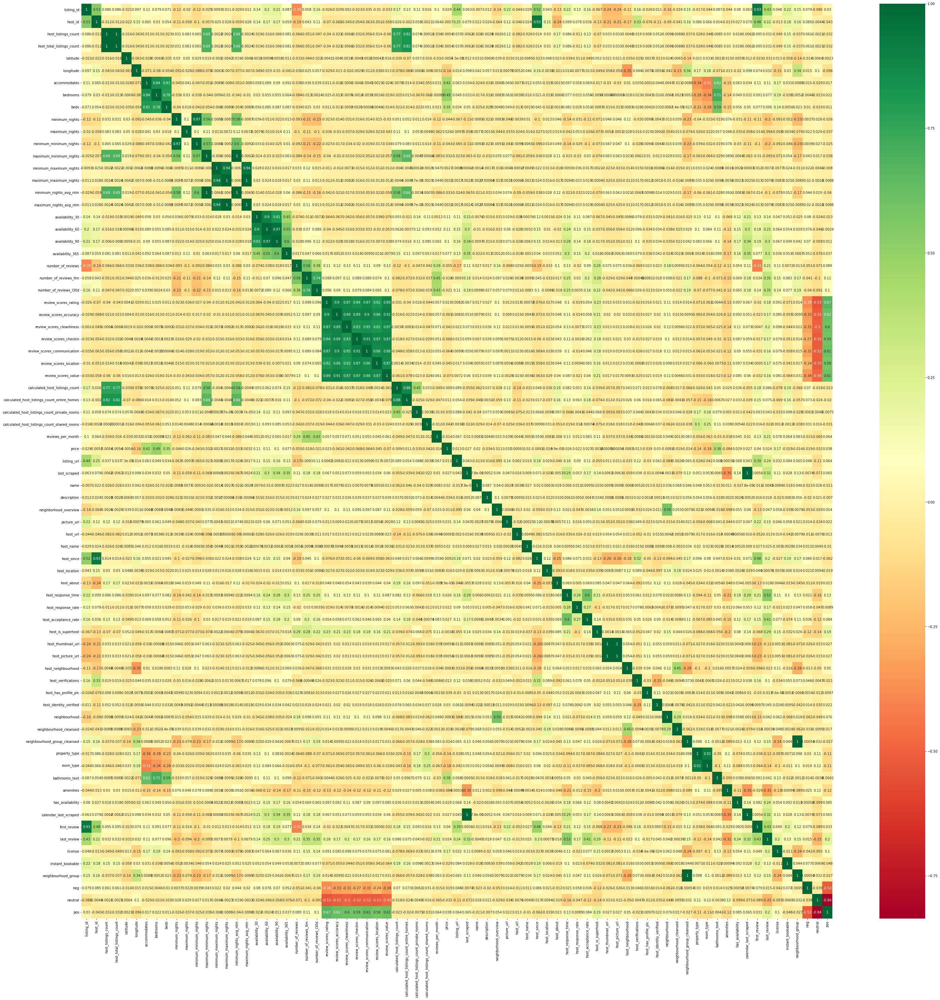

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
corrmat=comp_data.corr()
top_corr_features=corrmat.index
plt.figure(figsize=(50,50))
g=sns.heatmap(comp_data[top_corr_features].corr(),annot=True,cmap='RdYlGn')

In [ ]:
np.quantile(abs(corrmat.iloc[:,36]),0.7)

0.04199134324284712

In [ ]:
columns=[]
num=comp_data.columns.get_loc('price')
for i in range(corrmat.shape[0]):
  if (abs(corrmat.iloc[i,num])>=np.quantile(abs(corrmat.iloc[:,36]),0.7)) & (i!=num):
    columns.append(i)

selected_columns=comp_data.columns[columns]

In [ ]:
comp_data.columns
columns_num = columns
heatmap_variable_selected = comp_data.columns[columns_num]

## PCA

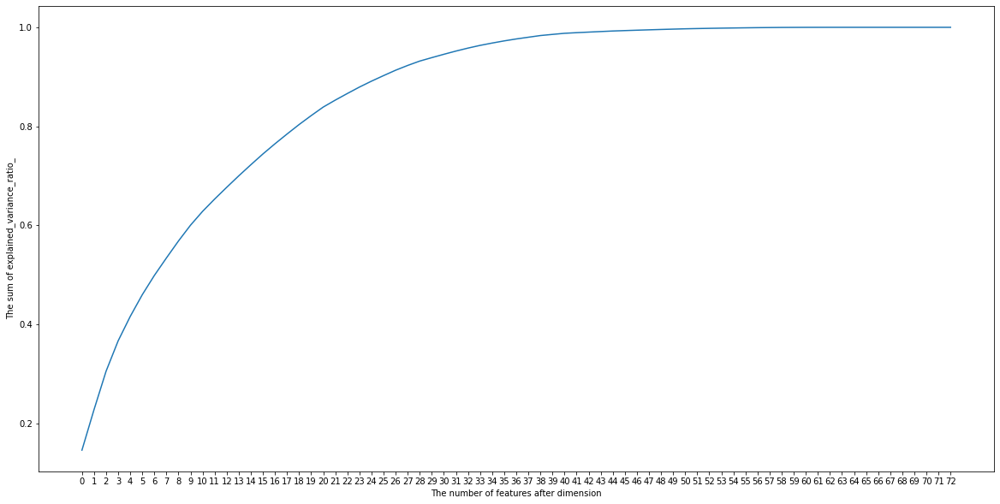

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
pca = PCA().fit(X)
pca_info = pca.explained_variance_ratio_
#print("ratio of each components of original data:",pca_info)

pca_info_sum = np.cumsum(pca_info)
#print("accumulative sum of i components:", pca_info_sum)

plt.figure(figsize=(20,10))
plt.plot(list(range(0,X.shape[1],1)),pca_info_sum)
plt.xticks(list(range(0,X.shape[1],1)))
plt.xlabel("The number of features after dimension")
plt.ylabel("The sum of explained_variance_ratio_")
plt.show()

In [ ]:
pca = PCA(n_components = 38)
X_pca = pca.fit_transform(X)

# Modeling

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR

In [ ]:
def train_modeling(X,y_variable):
  #split dataset
  X_train, X_test, y_train, y_test = train_test_split(X, y_variable, test_size=0.33, random_state=42)

  #Feature Scaling
  sc_X = StandardScaler()
  sc_y = StandardScaler()
  X_train_sc = pd.DataFrame(sc_X.fit_transform(X_train),index = X_train.index)
  X_test_sc = pd.DataFrame(sc_X.fit_transform(X_test),index = X_test.index)
  y_train_sc = pd.DataFrame(sc_y.fit_transform(y_train),index = y_train.index)
  y_test_sc = pd.DataFrame(sc_y.fit_transform(y_test),index = y_test.index)

  #Training the SVR model on the whole dataset
  regressor = SVR(kernel = 'rbf')
  regressor.fit(X_train_sc, y_train_sc)

  #Predicting a new result
  y_pred = pd.DataFrame(regressor.predict(X_test_sc).reshape(-1,1), index = X_test.index)

  #return np.concatenate((y_pred,y_test),axis = 1)
  res = pd.concat([y_pred,y_test], axis = 1)
  res = res.rename(columns = {0:'prediction','price':'real value'})
  res['undervalued or not'] = res.apply(lambda x : 1 if x[0] > x[1] else 0, axis = 1)
  return res

In [ ]:
#result using univariated selection
result_1 = train_modeling(X_1,y)
#result_1.head(5)
list_1 = result_1[result_1['undervalued or not'] == 1]# result=1 means it is undervalued
list_1

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



,prediction,real value,undervalued or not
9061,0.077534,0.00848,1
9197,0.161745,0.00888,1
18907,1.003469,0.01376,1
24478,0.363946,0.01036,1
3547,0.817885,0.02400,1
...,...,...,...
14515,0.083797,0.01000,1
23569,0.241036,0.00136,1
24005,0.209150,0.00884,1
15648,0.692068,0.02200,1


In [ ]:
#result using heatmap
result_2 = train_modeling(X[heatmap_variable_selected],y)
#result_2.head(5)
list_2 = result_2[result_2['undervalued or not'] == 1]
list_2

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



,prediction,real value,undervalued or not
9061,0.078508,0.00848,1
9197,0.132230,0.00888,1
18907,0.950249,0.01376,1
24478,0.513766,0.01036,1
3547,0.667306,0.02400,1
...,...,...,...
20340,0.025082,0.00592,1
24005,0.171241,0.00884,1
15648,0.672113,0.02200,1
426,0.084553,0.00796,1


In [ ]:
result_3[result_3['prediction'] < result_3['real value']]

,prediction,real value,undervalued or not
16098,-0.220929,0.00312,0
9685,-0.329829,0.00280,0
21506,-0.054697,0.00424,0
24167,-0.217864,0.00340,0
9061,-0.011252,0.00848,0
...,...,...,...
18669,-0.383133,0.00232,0
17236,-0.076221,0.00600,0
14236,-0.174304,0.00380,0
16723,-0.123346,0.00780,0


In [ ]:
X[heatmap_variable_selected]

,longitude,accommodates,bedrooms,beds,minimum_nights,minimum_minimum_nights,availability_30,availability_60,availability_90,availability_365,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,property_type,room_type,bathrooms_text,amenities,license
0,0.428240,0.3750,0.071429,0.08,0.025824,0.025824,0.000000,0.000000,0.000000,0.619178,...,1.000,0.600,0.800,1.000,0.80,0.114286,0.000000,0.375000,0.533228,0.000000
1,0.459471,0.0625,0.000000,0.00,0.025824,0.025824,0.033333,0.366667,0.577778,0.895890,...,0.982,1.000,0.994,1.000,0.97,0.523810,0.666667,0.104167,0.419158,0.000000
2,0.354198,0.0625,0.000000,0.00,0.005343,0.005343,0.800000,0.900000,0.933333,0.983562,...,0.914,0.930,0.940,0.980,0.88,0.523810,0.666667,0.083333,0.973464,0.037960
3,0.431237,0.1250,0.000000,0.04,0.026714,0.026714,0.000000,0.050000,0.366667,0.843836,...,0.766,0.792,0.860,0.928,0.80,0.133333,0.000000,0.062500,0.089836,0.000000
4,0.392398,0.0625,0.000000,0.00,0.025824,0.025824,0.233333,0.483333,0.655556,0.405479,...,0.970,0.982,0.984,0.958,0.94,0.571429,0.666667,0.104167,0.858966,0.217442
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25309,0.779450,0.3125,0.071429,0.04,0.000000,0.000000,0.300000,0.650000,0.744444,0.183562,...,0.800,0.600,1.000,1.000,1.00,0.180952,0.000000,0.062500,0.788136,0.000000
25310,0.469655,0.1250,0.000000,0.00,0.000000,0.000000,0.266667,0.583333,0.722222,0.928767,...,1.000,1.000,1.000,1.000,1.00,0.533333,0.666667,0.083333,0.060702,0.000000
25311,0.664489,0.1250,0.000000,0.00,0.000000,0.000000,0.666667,0.833333,0.888889,0.219178,...,1.000,1.000,1.000,1.000,1.00,0.533333,0.666667,0.041667,0.282102,0.000000
25312,0.658716,0.1250,0.000000,0.00,0.000000,0.000000,0.533333,0.733333,0.822222,0.956164,...,1.000,1.000,1.000,1.000,1.00,0.533333,0.666667,0.041667,0.144323,0.000000


In [ ]:
#result using pca
X_3 = pd.DataFrame(X_pca,index = X.index)
result_3 = train_modeling(X_3,y)
#result_3.head(5)
list_3 = result_3[result_3['undervalued or not'] == 1]
list_3

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



,prediction,real value,undervalued or not
9571,0.098268,0.01400,1
18907,0.367164,0.01376,1
24478,0.306539,0.01036,1
3547,0.640181,0.02400,1
19706,0.015678,0.00768,1
...,...,...,...
14515,0.112013,0.01000,1
24005,0.056623,0.00884,1
15648,0.643030,0.02200,1
23418,0.269990,0.01736,1


# Summary and Visualization

In [ ]:
#summary
def summaries_airbnb(list_):
  info_columns_numerical = ['number_of_reviews','review_scores_rating','bedrooms']
  print(listings.loc[list_.index][info_columns_numerical].describe())

  info_columns_object = ['neighbourhood','property_type','room_type']
  for column in info_columns_object:
    print('The top type of {} are'.format(column),'\n', listings.loc[list_.index][column].value_counts().head(10),'\n')

In [ ]:
summaries_airbnb(list_1)

       number_of_reviews  review_scores_rating     bedrooms
count        1686.000000           1393.000000  1485.000000
mean           37.992883              4.683891     1.666667
std            68.537178              0.660995     1.093968
min             0.000000              0.000000     1.000000
25%             1.000000              4.650000     1.000000
50%             9.000000              4.860000     1.000000
75%            45.000000              5.000000     2.000000
max           671.000000              5.000000     9.000000
The top type of neighbourhood are 
 Los Angeles, California, United States       601
Long Beach, California, United States         42
Santa Monica, California, United States       25
Glendale, California, United States           22
West Hollywood, California, United States     22
Pasadena, California, United States           22
Beverly Hills, California, United States      20
Malibu, California, United States             18
Hermosa Beach, California, Unite

In [ ]:
summaries_airbnb(list_2)

       number_of_reviews  review_scores_rating     bedrooms
count        1746.000000           1435.000000  1542.000000
mean           37.159794              4.689791     1.669909
std            68.492789              0.646327     1.073238
min             0.000000              0.000000     1.000000
25%             1.000000              4.670000     1.000000
50%             8.000000              4.870000     1.000000
75%            41.750000              5.000000     2.000000
max           671.000000              5.000000     9.000000
The top type of neighbourhood are 
 Los Angeles, California, United States       606
Long Beach, California, United States         41
Santa Monica, California, United States       30
Glendale, California, United States           26
West Hollywood, California, United States     23
Pasadena, California, United States           21
Beverly Hills, California, United States      20
Redondo Beach, California, United States      16
Malibu, California, United State

In [ ]:
summaries_airbnb(list_3)

       number_of_reviews  review_scores_rating     bedrooms
count        1947.000000           1610.000000  1715.000000
mean           38.391885              4.709503     1.660641
std            68.620132              0.589182     1.076560
min             0.000000              0.000000     1.000000
25%             2.000000              4.670000     1.000000
50%            10.000000              4.865000     1.000000
75%            46.000000              5.000000     2.000000
max           671.000000              5.000000     9.000000
The top type of neighbourhood are 
 Los Angeles, California, United States        701
Long Beach, California, United States          51
Santa Monica, California, United States        34
Glendale, California, United States            31
West Hollywood, California, United States      28
Beverly Hills, California, United States       24
Pasadena, California, United States            23
Malibu, California, United States              19
Rowland Heights, Califor

In [ ]:
import folium
import pandas as pd
from folium import plugins

latitude = 34.052235
longitude = -118.243683

def visualization(list_):
  # let's start again with a clean copy of the map of San Francisco
  san_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

  # instantiate a mark cluster object for the incidents in the dataframe
  incidents = plugins.MarkerCluster().add_to(san_map)

  # loop through the dataframe and add each data point to the mark cluster
  for lat, lng, label, in zip(listings.loc[list_.index]['latitude'], listings.loc[list_.index]['longitude'],listings2.loc[list_.index]['neighbourhood']):
      folium.Marker(
          location=[lat, lng],
          icon=None,
          popup=label,
      ).add_to(incidents)

  # add incidents to map
  return san_map.add_child(incidents)

In [ ]:
visualization(list_1)

In [ ]:
visualization(list_2)

In [ ]:
visualization(list_3)